In [1]:
import jax

# jax.config.update("jax_enable_x64", False)
jax.config.update("jax_enable_x64", True)
# jax.config.update("jax_platform_name", "cpu")
jax.config.update("jax_platform_name", "gpu")
# jax.config.update("jax_debug_nans", True)
print(jax.local_devices()[0].device_kind)
from jax import numpy as np, random as jr, tree as jtu
import os


from zodiax.optimisation import sgd, adam

import amigo
import dorito


# visualisation
import matplotlib.pyplot as plt
import matplotlib as mpl
import ehtplot
import scienceplots
import cmasher as cmr

# matplotlib parameters
plt.style.use(["science", "bright", "no-latex"])

plt.rcParams["image.cmap"] = "inferno"
plt.rcParams["font.family"] = "serif"
plt.rcParams["image.origin"] = "lower"
plt.rcParams["figure.dpi"] = 300
plt.rcParams["font.size"] = 8
plt.rcParams["xtick.direction"] = "out"
plt.rcParams["ytick.direction"] = "out"

inferno = mpl.colormaps["inferno"]
viridis = mpl.colormaps["viridis"]
seismic = mpl.colormaps["seismic"]
coolwarm = mpl.colormaps["coolwarm"]

inferno.set_bad("k", 0.5)
viridis.set_bad("k", 0.5)
seismic.set_bad("k", 0.5)
coolwarm.set_bad("k", 0.5)

NVIDIA GeForce RTX 2080 Ti


/home/max/miniforge3/envs/nuke/lib/python3.13/site-packages/amigo/optical_models.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources as pkg


In [2]:
from socket import gethostname

if gethostname() == "glinton":
    morgana = "/media/morgana1/"
else:
    morgana = "/Volumes/morgana1/"

data_path = os.path.join(morgana, "snert/max/data/JWST/IO/calslope/")
uncal_path = os.path.join(morgana, "snert/max/data/JWST/IO/uncal/")
amigo_cache = os.path.join(morgana, "snert/max/data/amigo_files/")

cache = os.path.join(amigo_cache, "v_0.0.10/")
output_path = os.path.join(amigo_cache, "outputs/IO/")

EXP_TYPE = "NIS_AMI"
FILTERS = [
    "F480M",
    "F430M",
    "F380M",
    # "F277W",
]

# Bind file path, type and exposure type
file_fn = lambda data_path, filters=FILTERS, **kwargs: amigo.files.get_files(
    # "/Users/mcha5804/JWST/ERS1373/calgrps/",
    data_path,
    "calslope",
    EXP_TYPE=EXP_TYPE,
    FILTER=filters,
    **kwargs,
)

# Loading in data

In [3]:
files = sorted(
    file_fn(data_path), key=lambda hdu: hdu[0].header.get("EXPMID", float("inf"))
)

sci_files = []
cal_files = []

for file in files:
    filename = file[0].header["FILENAME"].replace("_nis_calslope.fits", "")

    # manual bad pixel correction
    file["BADPIX"].data[58, 67] = 1
    file["BADPIX"].data[71, 22] = 1
    file["BADPIX"].data[65, 41] = 1
    file["BADPIX"].data[35, 70] = 1
    file["BADPIX"].data[70, 55] = 1
    file["BADPIX"].data[5, 5] = 1
    file["BADPIX"].data[-4, 37] = 1
    file["BADPIX"].data[51, 27] = 1
    file["BADPIX"].data[28, 18] = 1
    file["BADPIX"].data[32, 10] = 1

    file["BADPIX"].data[:, :3] = 1
    file["BADPIX"].data[:, -3:] = 1
    file["BADPIX"].data[:3, :] = 1
    file["BADPIX"].data[-3:, :] = 1

    # if file[0].header["TARGPROP"] == "NGC1068":
    if not bool(file[0].header["IS_PSF"]):
        sci_files.append(file)
    elif bool(file[0].header["IS_PSF"]):
        file[0].header["TARGPROP"] = "HD 2236"
        cal_files.append(file)
    else:
        print(f"Unkown target: {file[0].header['TARGPROP']}")

# dorito.misc.truncate_files(cal_files, 5)
dorito.misc.truncate_files(sci_files, 18)

In [4]:
from astropy.time import Time

for file in files:
    h = file[0].header
    t = Time(h["EXPMID"], format="mjd")
    print(
        f'{h["TARGPROP"]} {h["FILTER"]}, Dither {h["PATT_NUM"]}/{h["NUMDTHPT"]}, Roll {h["ROLL_REF"]:.1f}deg, {h["XPOSURE"] / 60:.1f}min, {t.iso}'
    )

IO F430M, Dither 1/5, Roll 247.4deg, 5.7min, 2022-08-01 16:35:16.729
IO F430M, Dither 2/5, Roll 247.4deg, 5.7min, 2022-08-01 16:43:49.689
IO F430M, Dither 3/5, Roll 247.4deg, 5.7min, 2022-08-01 16:52:22.840
IO F430M, Dither 4/5, Roll 247.4deg, 5.7min, 2022-08-01 17:00:55.736
IO F430M, Dither 5/5, Roll 247.4deg, 5.7min, 2022-08-01 17:09:28.759
HD 2236 F430M, Dither 1/4, Roll 247.4deg, 0.1min, 2022-08-01 17:53:41.546
HD 2236 F430M, Dither 2/4, Roll 247.4deg, 0.1min, 2022-08-01 17:55:01.418
HD 2236 F430M, Dither 3/4, Roll 247.4deg, 0.1min, 2022-08-01 17:56:21.290
HD 2236 F430M, Dither 4/4, Roll 247.4deg, 0.1min, 2022-08-01 17:57:39.114


In [5]:
load_dict = lambda x: np.load(f"{x}", allow_pickle=True).item()

cal_exposures = [amigo.model_fits.SplineVisFit(file) for file in cal_files]
sci_exposures = [amigo.model_fits.SplineVisFit(file) for file in sci_files]
exposures = cal_exposures + sci_exposures


model = amigo.core_models.AmigoModel(
    exposures,
    optics=amigo.optical_models.AMIOptics(),
    detector=amigo.detector_models.LinearDetector(),
    ramp_model=amigo.ramp_models.NonLinearRamp(),
    read=amigo.read_models.ReadModel(),
    vis_model=amigo.vis_models.LogVisModel(
        load_dict(cache + "vis_basis.npy"), n_basis=420
    ),
    state=load_dict(cache + "calibration.npy"),
)

In [6]:
# for exp in exposures:
#     exp.print_summary()
#     amigo.plotting.summarise_fit(model, exp, residuals=False)

In [7]:
# pos_keys = []
spc_keys = []
for exp in exposures:
    if not exp.calibrator:
        # pos_keys.append(exp.map_param("positions"))
        spc_keys.append(exp.map_param("spectra"))


def norm_fn(model_params, args):
    params = model_params.params
    # if "log_distribution" in params.keys():
    #     for k, log_dist in params["log_distribution"].items():
    #         distribution = 10**log_dist
    #         params["log_distribution"][k] = np.log10(distribution / distribution.sum())

    if "spectra" in params.keys():
        spectra = jtu.map(
            lambda x: np.clip(x, a_min=-0.8, a_max=0.8), params["spectra"]
        )
        params["spectra"] = spectra

    return model_params.set("params", params), args


pscale = lambda model: model.optics.psf_pixel_scale / model.optics.oversample

In [ ]:
n_epoch = 1

config = {
    "positions": sgd(4e-2, 0),
    "fluxes": sgd(2e-2, 0),
    "aberrations": sgd(5e-2, 4),
    "spectra": sgd(3e-2, 10),
    "phases": sgd(2e0, 50),
    "amplitudes": sgd(2e0, 50),
}


def grad_fn(model, grads, args):
    # # Nuke the position gradients for the science exposures
    # if "positions" in config.keys():
    #     grads = grads.multiply(pos_keys, 0.0)

    # Reduce spectra gradients for the science exposures
    if "spectra" in config.keys():
        grads = grads.multiply(spc_keys, 1e-2)
    return grads, args


trainer = amigo.fitting.Trainer(
    cache=os.path.join(amigo_cache, "fishers/"),
    grad_fn=grad_fn,
)

trainer = trainer.populate_fishers(
    model,
    exposures,
    hessians=load_dict(cache + "jacobians.npy")["hessian"],
    parameters=list(config.keys()),
)

print("Number of exposures: ", len(exposures))

# Train the model
result = trainer.train(
    model=model,
    optimisers=config,
    epochs=n_epoch,
    batches=[exposures[0]],
    # batches=amigo.fitting.batch_exposures(exposures, n_batch=len(exposures) // 3),
)

Number of exposures:  9


  0%|          | 0/1 [00:00<?, ?it/s]

Compiling Loss function...


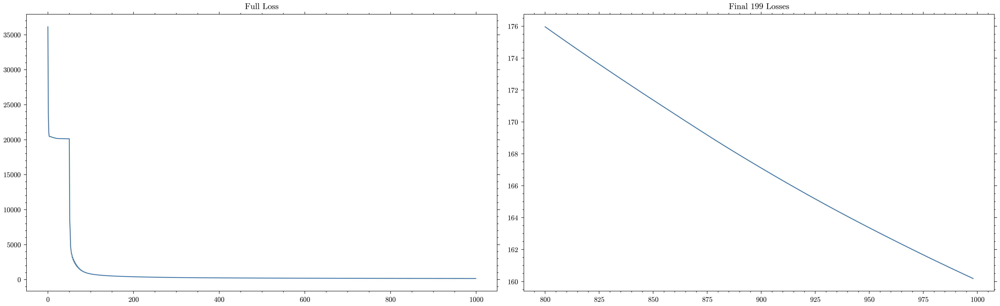

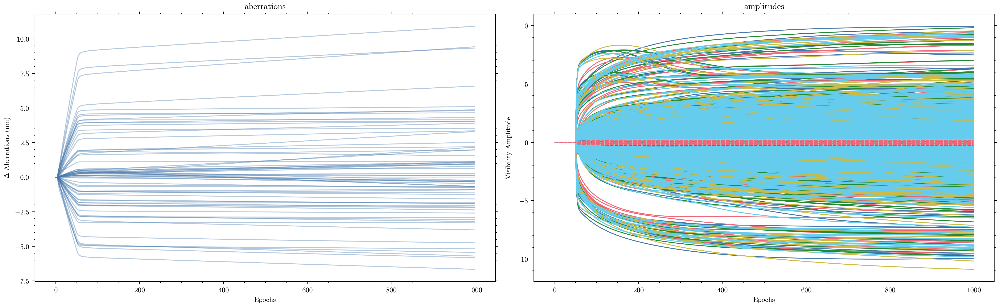

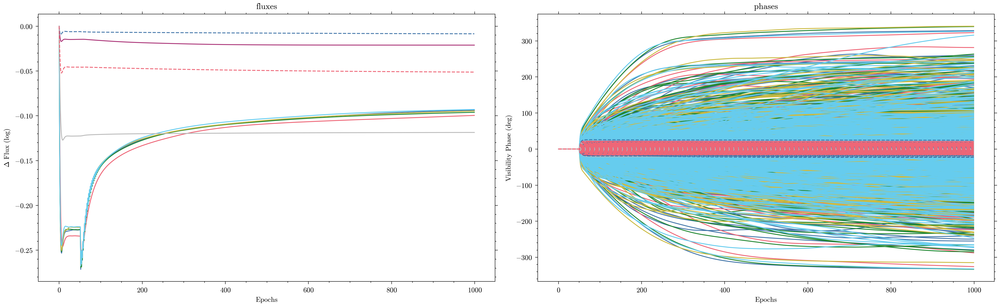

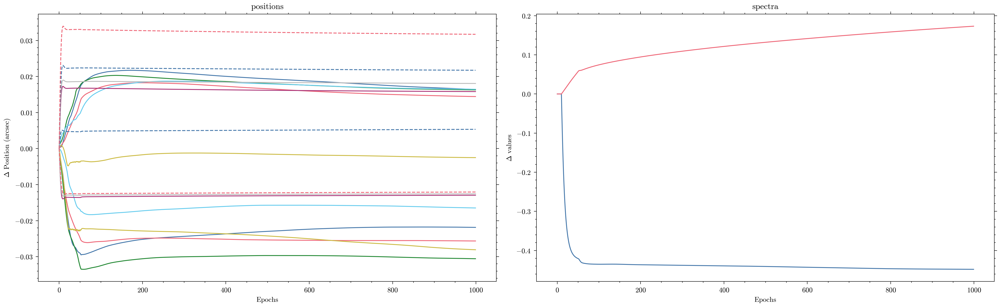

HD 2236


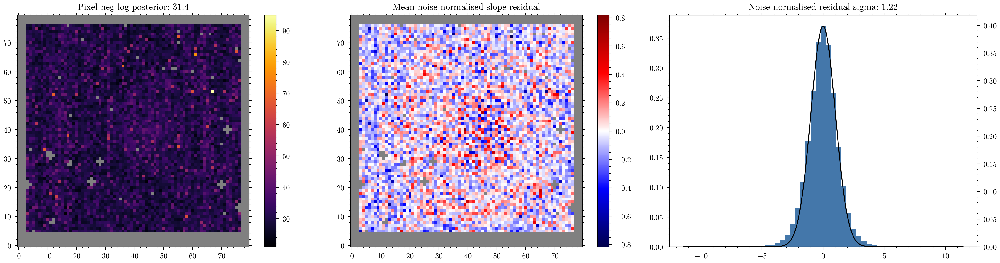

HD 2236


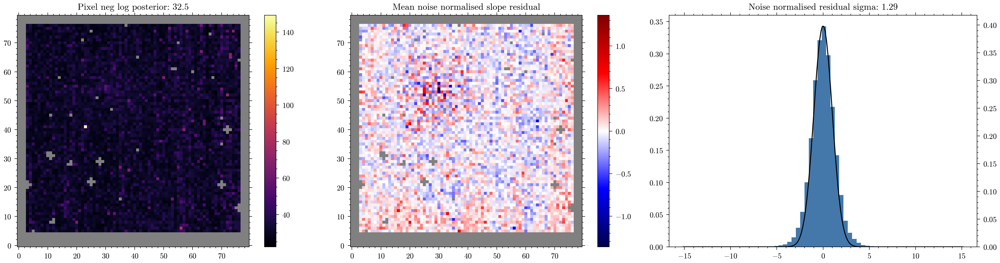

HD 2236


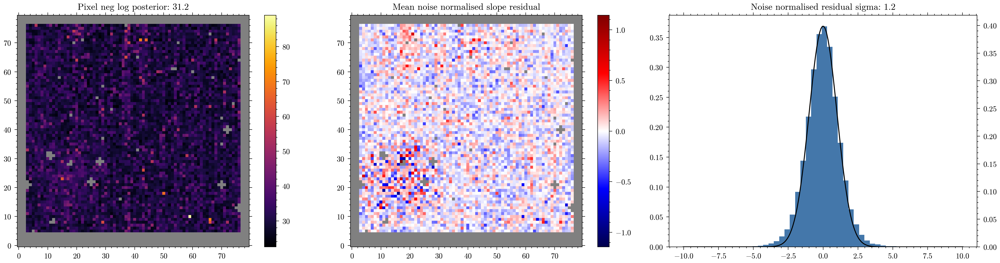

HD 2236


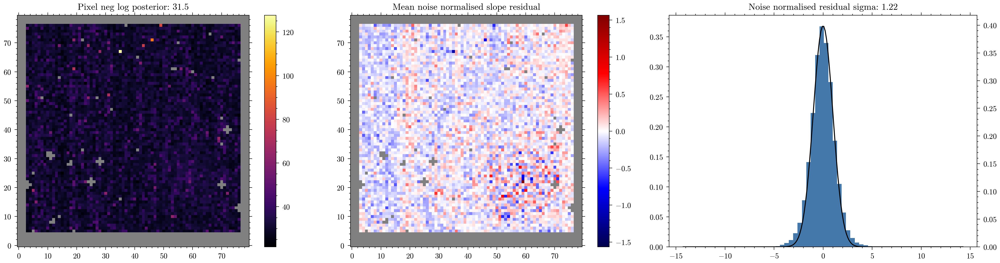

IO


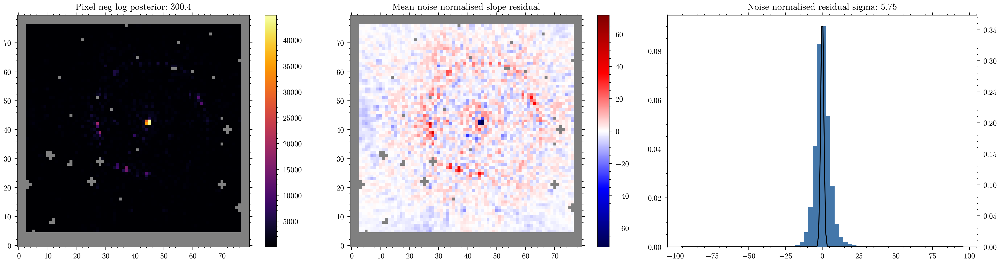

IO


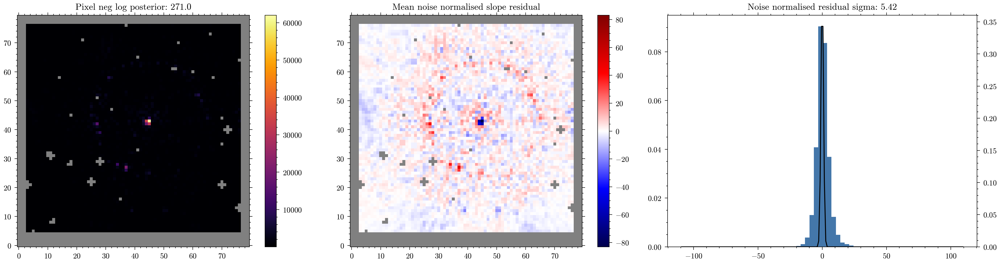

IO


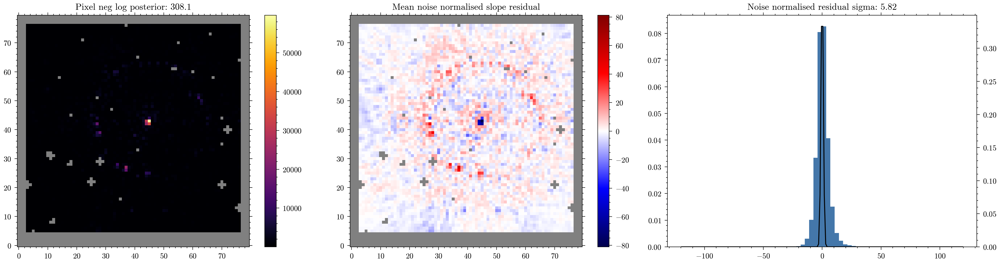

IO


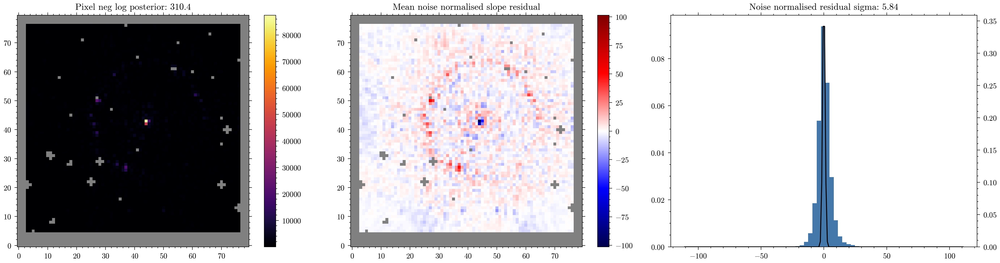

IO


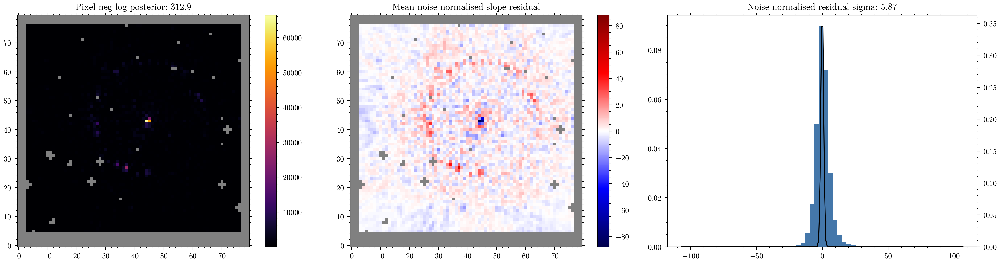

In [9]:
losses = np.array([v for v in result.losses.values()]).mean(0)

amigo.plotting.plot_losses(losses, start=int(0.8 * n_epoch))
amigo.plotting.plot(result.history)

# for exp in exposures:
for exp in exposures:
    print(exp.star)
    amigo.plotting.summarise_fit(result.model, exp)

In [ ]:
# np.save(output_path + "sceondtbigrun.npy", result.model.params, allow_pickle=True)

# final_model = result.model

final_model = model.set(
    "params", np.load(output_path + "sceondtbigrun.npy", allow_pickle=True).item()
)

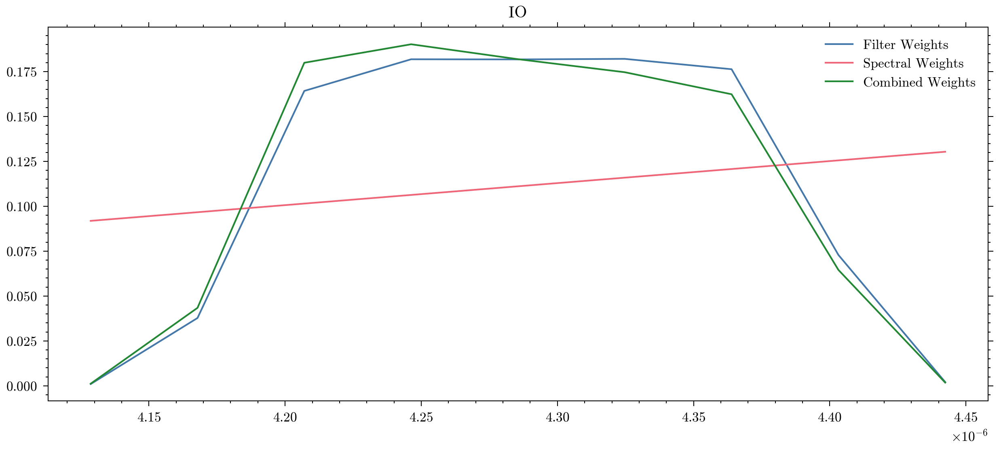

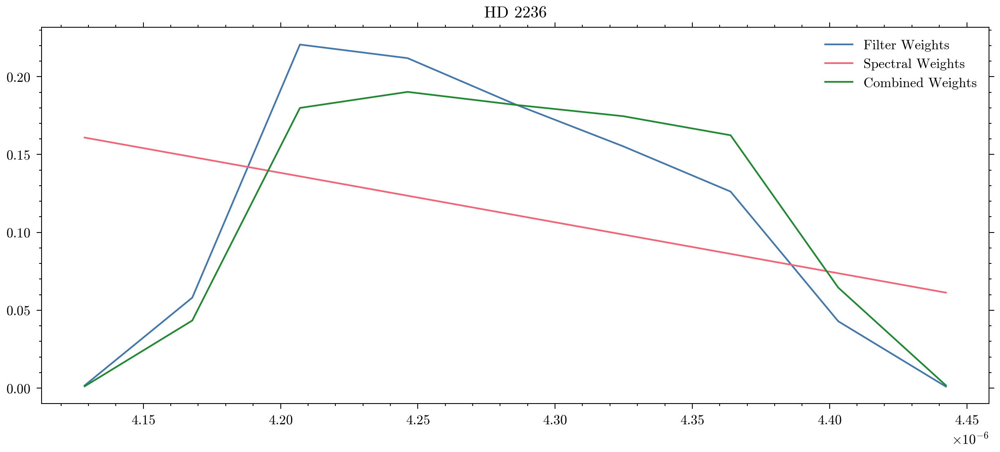

In [ ]:
stars = list(set([exp.star for exp in exposures]))

for targ_star in stars:
    plt.figure(figsize=(10, 4))
    plt.title(f"{targ_star}")
    for key, spec in final_model.spectra.items():
        star, filt = key.split("_")

        if star != targ_star:
            continue

        wavels, filt_weights = model.filters[filt]
        xs = np.linspace(-1, 1, len(wavels), endpoint=True)
        spectra_slopes = 1 + spec * xs
        weights = filt_weights * spectra_slopes  # * wavels

        #
        filt_weights = filt_weights / filt_weights.sum()
        spectra_slopes = spectra_slopes / spectra_slopes.sum()
        weights = weights / weights.sum()

        plt.plot(wavels, weights, label="Filter Weights")
        plt.plot(wavels, spectra_slopes, label="Spectral Weights")
        plt.plot(wavels, filt_weights, label="Combined Weights")

    plt.legend()
    plt.show()

In [ ]:
def norm_fn(model_params, args):
    params = model_params.params
    # if "log_distribution" in params.keys():
    #     for k, log_dist in params["log_distribution"].items():
    #         distribution = 10**log_dist
    #         params["log_distribution"][k] = np.log10(distribution / distribution.sum())

    if "spectra" in params.keys():
        spectra = jtu.map(
            lambda x: np.clip(x, a_min=-0.8, a_max=0.8), params["spectra"]
        )
        params["spectra"] = spectra

    return model_params.set("params", params), args

In [ ]:
import equinox as eqx
import optimistix as optx
from amigo.core_models import ModelParams


def get_proj_mat(fmat):
    """Get the projection matrix for a Fisher matrix"""
    eig_vals, eig_vecs = np.linalg.eig(-fmat)
    return (eig_vals.real**-0.5)[:, None] * eig_vecs.real.T


proj_mats = jtu.map(get_proj_mat, trainer.fishers)


@eqx.filter_jit
def fun(params, args):
    model, exp, model_params, proj_mats, shapes = args

    # Project and add the parameters
    proj_params = jtu.map(lambda x, y: np.dot(x, y), proj_mats, params)
    model_params = jtu.map(lambda x, y: x + y, model_params, proj_params)
    model_params = jtu.map(lambda x, y: x.reshape(y), model_params, shapes)

    model_params, _ = norm_fn(model_params, {})

    model = model_params.inject(model)

    # Return the loss
    return -np.nanmean(exp.mv_zscore(model))


params = ["amplitudes", "phases", "fluxes", "spectra"]
# final_model = result.model

args_out = {}
sols_out = {}
for exp in exposures:

    # if exp.key in sols_out.keys():
    #     print(f"Skipping {exp.key} as it is already solved.")
    #     continue

    # if exp.calibrator:
    #     print(f"Skipping calibrator {exp.key}.")
    #     continue

    opt_params = {}
    fishers = {}
    shapes = {}
    for param in params:
        key = exp.map_param(param)
        shapes[key] = final_model.get(key).shape
        opt_params[key] = final_model.get(key).flatten()
        fishers[key] = trainer.fishers[f"{exp.key}.{param}"]

    shapes = ModelParams(shapes)
    model_params = ModelParams(opt_params)
    initial_params = jtu.map(lambda x: np.zeros_like(x), model_params)
    proj_mats = jtu.map(get_proj_mat, ModelParams(fishers))
    proj_mats = jtu.map(lambda x: np.where(np.isnan(x) | np.isinf(x), 0, x), proj_mats)

    args = (final_model, exp, model_params, proj_mats, shapes)
    args_out[exp.key] = args

    try:
        print("Initial loss:", fun(initial_params, args))
    except Exception as e:
        print(f"Skipped {exp.key}")
        continue
    solver = optx.BFGS(rtol=1e-4, atol=1e-4)
    sol = optx.minimise(fun, solver, initial_params, args, throw=False, max_steps=2**16)
    sols_out[exp.key] = sol

    print("Final loss:", fun(sol.value, args))
    print(sol.stats["num_steps"], sol.state.num_accepted_steps)
    print(optx.RESULTS[sol.result])
    print()

Initial loss: 291.4692794025104
Final loss: 36.42444279981218
16384 16021
The maximum number of steps was reached in the nonlinear solver. The problem may not be solveable (e.g., a root-find on a function that has no roots), or you may need to increase `max_steps`.

Initial loss: 293.92332011349623


In [ ]:
args_out.keys()

dict_keys(['01373_023_02_03_1', '01373_023_02_03_2', '01373_023_02_03_3', '01373_023_02_03_4', '01373_017_02_04_1', '01373_017_02_04_2', '01373_017_02_04_3', '01373_017_02_04_4', '01373_017_02_04_5'])

In [ ]:
spectra = {}
for key, args in sols_out.items():
    proj_mats = args[3]
    proj_params = jtu.map(lambda x, y: np.dot(x, y), proj_mats, sols_out[key].value)
    model_params = jtu.map(lambda x, y: x + y, args[2], proj_params)
    model_params = jtu.map(lambda x, y: x.reshape(y), model_params, args[4])
    final_model = model_params.inject(final_model)

    # Spectra is joint-fit so we take the mean
    exp = args[1]
    spec = model_params.params[exp.map_param("spectra")]
    spec_key = exp.get_key("spectra")
    if spec_key not in spectra:
        spectra[spec_key] = [spec]
    else:
        spectra[spec_key].append(spec)

spectra = jtu.map(
    lambda x: np.array(x).mean(), spectra, is_leaf=lambda x: isinstance(x, list)
)
final_model = final_model.set("spectra", spectra)

final_state = {}
for key, values in result.state.items():
    final_state[key] = final_model.get(key)

TypeError: 'Solution' object is not subscriptable

In [ ]:
# final_state = load_dict(output_path + "final_state.npy")

# params = {}
# for key, value in model.params.items():
#     if key in final_state.keys():
#         params[key] = final_state[key]
#     else:
#         params[key] = value
# final_model = model.set("params", params)

F430M Calibrator HD 2236 12


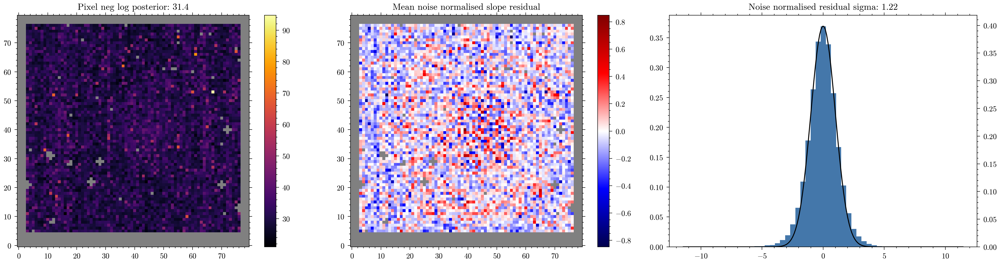

F430M Calibrator HD 2236 12


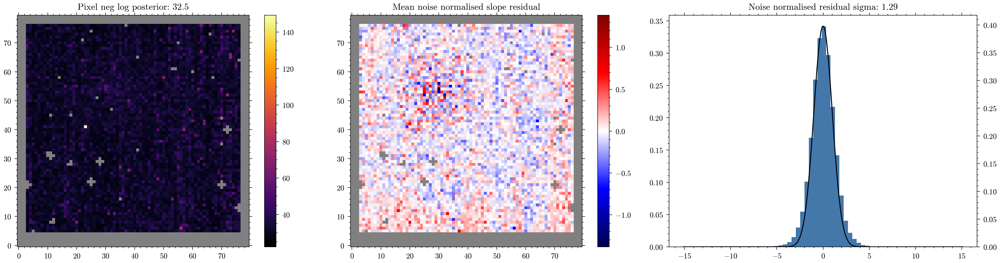

F430M Calibrator HD 2236 12


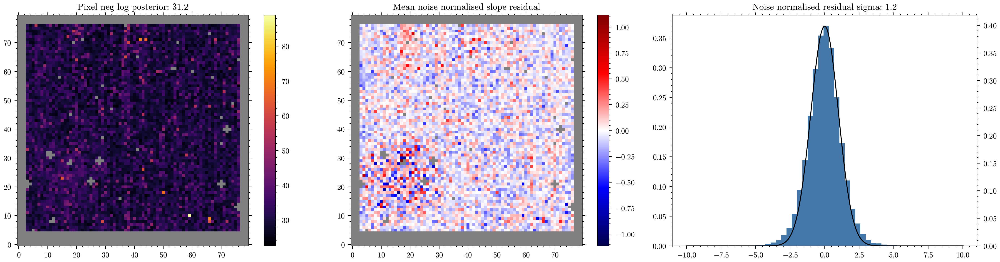

F430M Calibrator HD 2236 12


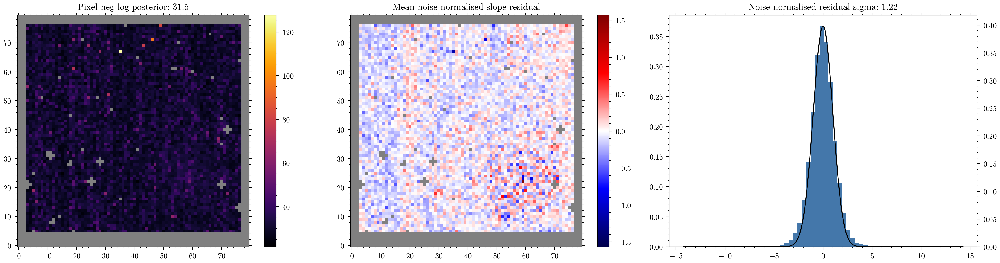

F430M Science IO 18


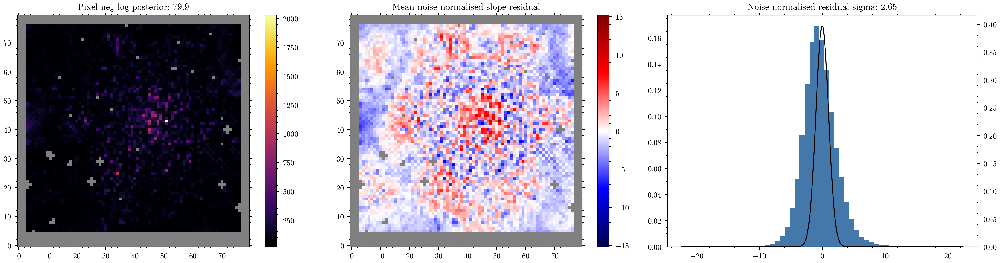

F430M Science IO 18


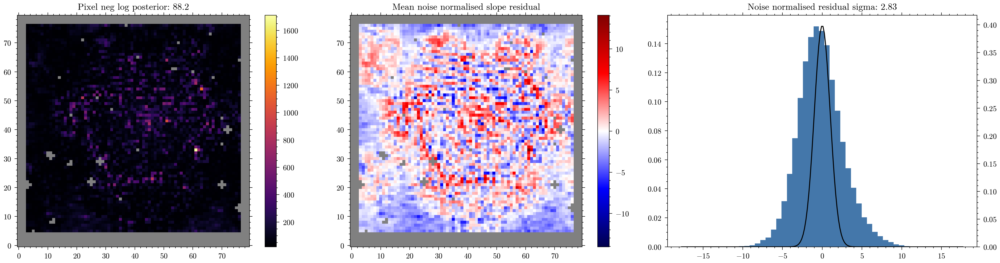

F430M Science IO 18


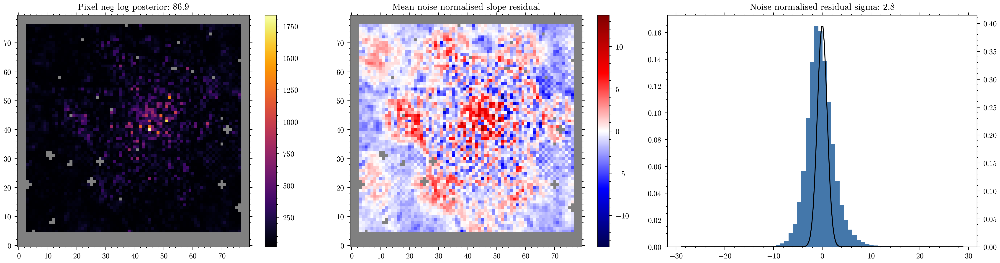

F430M Science IO 18


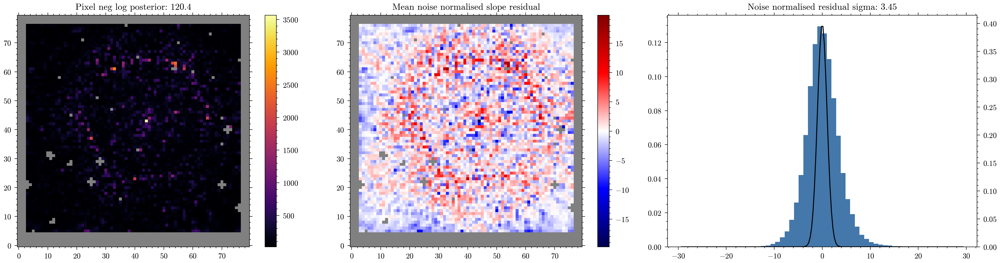

F430M Science IO 18


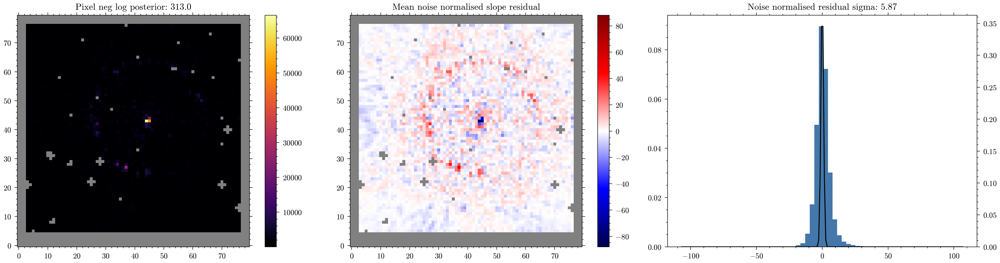

In [ ]:
for filt in ["F380M", "F430M", "F480M"]:
    for exp in exposures:
        if exp.filter == filt:
            exp_type = "Calibrator" if exp.calibrator else "Science"
            print(exp.filter, exp_type, exp.star, exp.ngroups)
            amigo.plotting.summarise_fit(final_model, exp)

In [ ]:
# np.save("files/bgmaskparams_pds70.npy", final_model.params, allow_pickle=True)

# final_model = model.set(
#     "params", np.load("files/bgmaskparams_pds70.npy", allow_pickle=True).item()
# )

In [ ]:
import jax.tree as jtu
from tqdm.notebook import tqdm
from amigo.fisher import FIM


fmats = {}
for exp in tqdm(exposures):
    loglike_fn = lambda model: -np.nansum(exp.loglike(model))
    params = [exp.map_param("amplitudes"), exp.map_param("phases")]
    fmat = FIM(final_model, params, loglike_fn, reduce_ram=True, batch_size=10)
    fmats[exp.get_key("phases")] = fmat

  0%|          | 0/9 [00:00<?, ?it/s]

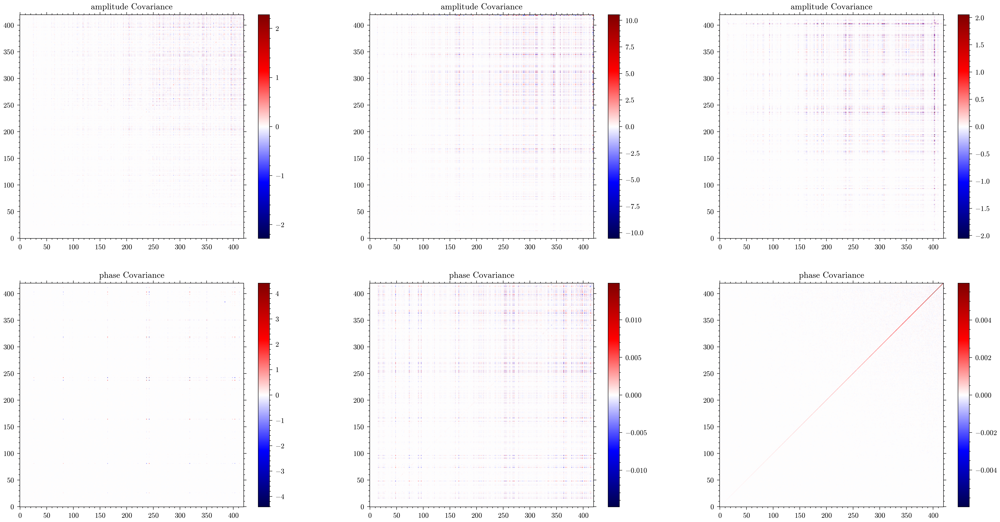

In [ ]:
full_covs = jtu.map(lambda x: np.linalg.inv(x), fmats)

n = model.vis_model.n_basis
amp_covs = jtu.map(lambda x: x[:n, :n], full_covs)
phase_covs = jtu.map(lambda x: x[n:, n:], full_covs)

covs = {
    "amplitudes": amp_covs,
    "phases": phase_covs,
}

plt.figure(figsize=(20, 10))
for i, key in enumerate(amp_covs):
    if i > 5:
        break

    if i < 3:
        param = "amplitude"
        cov = amp_covs[key]
    else:
        param = "phase"
        cov = amp_covs[key]
    plt.subplot(2, 3, i + 1)
    plt.title(f"{param} Covariance")
    v = np.nanmax(np.abs(cov))
    plt.imshow(cov, seismic, vmin=-v, vmax=v)
    # plt.imshow(np.log10(np.abs(cov)), inferno)
    plt.colorbar()
plt.show()

In [ ]:
fit_outputs = {
    "n_basis": final_model.vis_model.n_basis,
}

for exp in exposures:
    get_fn = lambda param: final_model.get(exp.map_param(param))
    fit_outputs[exp.key] = {
        "star": exp.star,
        "calibrator": exp.calibrator,
        "filter": exp.filter,
        "parang": exp.parang,
        "defocus": final_model.get(exp.map_param("defocus")),
        "n_basis": final_model.vis_model.n_basis,
        "fishers": fmats[exp.get_key("phases")],
        "amp_cov": amp_covs[exp.get_key("phases")],
        "phase_cov": phase_covs[exp.get_key("phases")],
        **{param: get_fn(param) for param in final_state.keys()},
    }

np.save(output_path + f"io_visibilities", fit_outputs, allow_pickle=True)

NameError: name 'final_state' is not defined